In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import TimeSeriesSplit
from keras.layers import Dropout
from sklearn.metrics import mean_squared_error
from keras import optimizers

# Prepare Data

In [2]:
def preparedata(file):
    cloud_cover = pd.read_csv(file, skipinitialspace = True)
    cloud_cover['Date'] = cloud_cover[['Year', 'Month', 'Day']].apply(lambda x: "{0}-{1}-{2}".format(str(x[0]).zfill(2), str(x[1]).zfill(2), str(x[2]).zfill(2)), axis=1) 
    cloud_cover['Time'] = cloud_cover[['Hour', 'Minute']].apply(lambda x: "{}:{}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Year", "Month", "Day", "Hour", "Minute", "Second"], axis=1, inplace=True)  
    cloud_cover = cloud_cover.rename(columns={"CloudCover":"cloud_cover"})
    cloud_cover = cloud_cover.groupby(['Date', 'Time']).agg(cloud_cover=('cloud_cover','mean')).reset_index()
    cloud_cover['DateTime'] = cloud_cover[['Date', 'Time']].apply(lambda x: "{} {}".format(str(x[0]).zfill(2), str(x[1]).zfill(2)), axis=1)
    cloud_cover.drop(["Date", "Time"], axis=1, inplace=True)        
    cloud_cover['DateTime'] = pd.to_datetime(cloud_cover['DateTime'], format="%Y-%m-%d %H:%M")
    cloud_cover.dropna(inplace=True)
    return cloud_cover

In [3]:
cloud_cover = preparedata('../prophet_ver2/Bangkhuntean_CloudCover_2021-16Nov-16Dec.csv')
cloud_cover

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
15056,0.168000,2021-12-16 13:58:00
15057,0.169000,2021-12-16 13:59:00
15058,0.147000,2021-12-16 14:00:00
15059,0.145000,2021-12-16 14:01:00


In [4]:
def lags_train_test(data, lags):
	X, y = [], []
	for i in range(lags, len(data)):
		X.append(data[i-lags:i])
		y.append(data[i])
	return np.array(X), np.array(y)

In [5]:
def Xtrain_ytrain(train,test,lags):
    #scale train
    sc = MinMaxScaler()
    sc.fit(train)
    train_set_scale = sc.transform(train)
    # train
    X_train, y_train = lags_train_test(train_set_scale, lags)
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))
    print("X_train Shape :", X_train.shape)
    print("y_train Shape :", y_train.shape)

    #scale test
    dataset_total = pd.concat((train['cloud_cover'], test['cloud_cover']), axis=0)
    inputs = dataset_total[len(dataset_total) - len(test) - lags:].values
    inputs = inputs.reshape(-1,1)
    inputs = sc.transform(inputs)
    # test
    X_test, y_test = lags_train_test(inputs, lags)
    print("X_test Shape : ", X_test.shape)
    print("y_test Shape : ", y_test.shape)
    return X_train, y_train, X_test, y_test, sc

In [6]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [7]:
def plot_curve(history):
    # loss curves
    fig1 = plt.figure(figsize=[8,6])
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    plt.plot(epochs, loss, 'orange', label='Training loss')
    plt.plot(epochs, val_loss, 'b', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

In [8]:
def plot_test(train,pred):
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(mode = 'lines', x = train['DateTime'], y = train['cloud_cover'], name = 'Train'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['cloud_cover'], name = 'Actual'))
    fig2.add_trace(go.Scatter(mode = 'lines', x = pred['DateTime'], y = pred['LSTM'], name = 'Predict'))
    fig2.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
    )


    fig2.update_layout(
        xaxis=dict(
            rangeselector=dict(
                buttons=list([
                    dict(count=1,
                        label="1.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=2,
                        label="2.zoom",
                        step="hour",
                        stepmode="backward"),
                    dict(count=3,
                        label="3.zoom",
                        step="day",
                        stepmode="backward"),              

                    dict(step="all")
                ])
            ),
            rangeslider=dict(
                visible=True
            ),
            type="date"
        )
    )

    fig2.show()

In [9]:
def compare_mse_model(model,model_1):
    mse_error = [model,model_1]
    error = pd.DataFrame({"Model" : ['model','model_1'], "MSE error": mse_error})
    if model < model_1:
        model = model
        print("Better MSE value is : " , model)
    else:
        model_1 = model_1
        print("Better MSE value is : ", model_1)
    return error

# Train/Test Model

In [10]:
train,test = train_test_split(cloud_cover, train_size=0.8, shuffle=False)
print('Train Shape', train.shape)
print('Test Shape', test.shape)

Train Shape (12048, 2)
Test Shape (3013, 2)


In [11]:
train

,cloud_cover,DateTime
0,0.990000,2021-11-16 11:15:00
1,0.989000,2021-11-16 11:16:00
2,0.987667,2021-11-16 11:17:00
3,0.987000,2021-11-16 11:18:00
4,0.987000,2021-11-16 11:19:00
...,...,...
12043,0.647000,2021-12-10 15:19:00
12044,0.654000,2021-12-10 15:20:00
12045,0.654000,2021-12-10 15:21:00
12046,0.578000,2021-12-10 15:22:00


In [12]:
train = train.set_index('DateTime')
test = test.set_index('DateTime')

In [13]:
# X_train, y_train, X_test and y_test
X_train, y_train, X_test, y_test, sc = Xtrain_ytrain(train,test,25)

X_train Shape : (12023, 25, 1)
y_train Shape : (12023, 1)
X_test Shape :  (3013, 25, 1)
y_test Shape :  (3013, 1)


c:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but MinMaxScaler was fitted with feature names
  warnings.warn(


In [14]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

## Optimizer adam

### batch size 32 Add frist layer units = 50 epochs 10 

In [15]:
test1 = test.copy()

In [16]:
model_50_adam = Sequential()
model_50_adam.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_adam.add(Dense(units = 1))
model_50_adam.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_adam = model_50_adam.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 10s 17ms/step - loss: 0.0126 - val_loss: 0.0039
Epoch 2/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0024 - val_loss: 0.0032
Epoch 3/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0019 - val_loss: 0.0029
Epoch 4/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0016 - val_loss: 0.0026
Epoch 5/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 6/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 7/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 8/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0010 - val_l

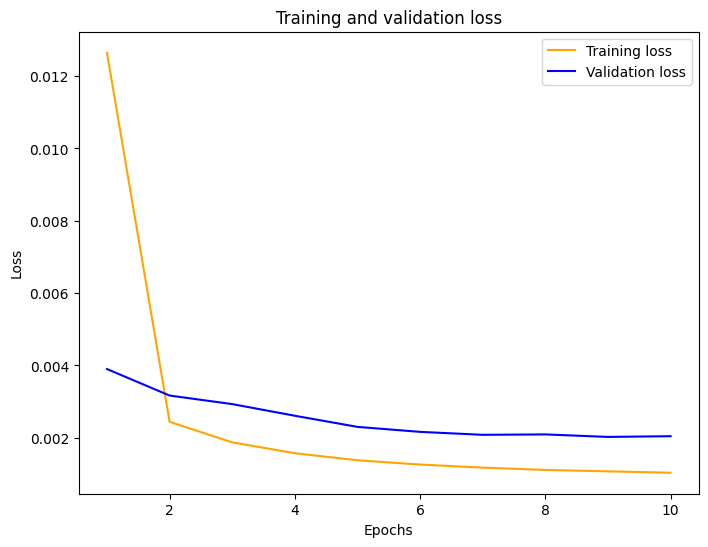

In [17]:
plot_curve(hist_adam)

In [18]:
predict_scaled_adam = model_50_adam.predict(X_test)
predict_adam = sc.inverse_transform(predict_scaled_adam)
test1['LSTM_adam'] = predict_adam
test1

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam
0,2021-12-10 15:24:00,0.538,0.553521
1,2021-12-10 15:25:00,0.588,0.539090
2,2021-12-10 15:26:00,0.566,0.582801
3,2021-12-10 15:27:00,0.562,0.574865
4,2021-12-10 15:28:00,0.612,0.564166
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.179252
3009,2021-12-16 13:59:00,0.169,0.178754
3010,2021-12-16 14:00:00,0.147,0.179494
3011,2021-12-16 14:01:00,0.145,0.162189


In [19]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_adam'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [20]:
lstm_mse_error_unit_50_adam = mean_squared_error(test1['cloud_cover'], test1['LSTM_adam'], squared=True)
lstm_mse_error_unit_50_adam

0.0020314994938220687

In [21]:
mse_data = pd.DataFrame(columns=['Lags' ,'Optimizer', 'Batch_size', 'Learning rate', 'The frist layer', 'The frist layer add Drop out', 'The second layer', 'The second layer add Drop out', 
                                 'The third layer', 'The output layer', 'epochs','mse error'])

data = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_adam}]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_3412\3535433531.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,25,Adam,32,,50,,,,,1,10,0.002031


---

## Optimizer RMSprop

### Add frist layer: units = 50

In [22]:
model_50_rms = Sequential()
model_50_rms.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_50_rms.add(Dense(units = 1))
model_50_rms.compile(optimizer = 'RMSprop', loss = 'mean_squared_error')
hist_50_rms = model_50_rms.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 10s 15ms/step - loss: 0.0083 - val_loss: 0.0035
Epoch 2/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0018 - val_loss: 0.0024
Epoch 3/10
376/376 [==============================] - 6s 15ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 4/10
376/376 [==============================] - 7s 18ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 5/10
376/376 [==============================] - 6s 16ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 6/10
376/376 [==============================] - 6s 17ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 7/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 8/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 9/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0010 - val_l

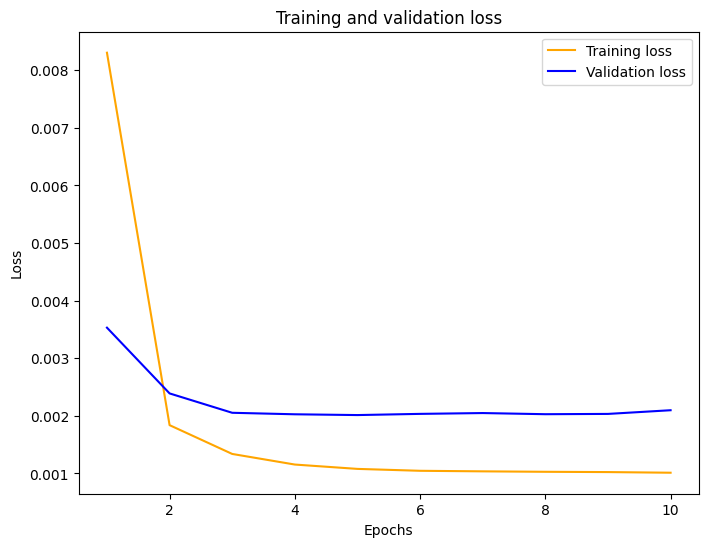

In [23]:
plot_curve(hist_50_rms)

In [24]:
predict_scaled_50_rms = model_50_rms.predict(X_test)
predict_50_rms = sc.inverse_transform(predict_scaled_50_rms)
test1['LSTM_50_rms'] = predict_50_rms
test1

95/95 [==============================] - 1s 5ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms
0,2021-12-10 15:24:00,0.538,0.553521,0.559533
1,2021-12-10 15:25:00,0.588,0.539090,0.542474
2,2021-12-10 15:26:00,0.566,0.582801,0.596317
3,2021-12-10 15:27:00,0.562,0.574865,0.573795
4,2021-12-10 15:28:00,0.612,0.564166,0.570051
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.179252,0.171905
3009,2021-12-16 13:59:00,0.169,0.178754,0.171770
3010,2021-12-16 14:00:00,0.147,0.179494,0.172720
3011,2021-12-16 14:01:00,0.145,0.162189,0.151798


In [25]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_50_rms'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [26]:
lstm_mse_error_unit_50_rms = mean_squared_error(test1['cloud_cover'], test1['LSTM_50_rms'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_rms)

Better MSE value is :  0.0020314994938220687


,Model,MSE error
0,model,0.002031
1,model_1,0.002087


In [27]:
data1 = [{'Lags':25 ,'Optimizer':'RMSprop', 'Batch_size':32, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_rms}]

mse_data = mse_data.append(data1,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_3412\905693436.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,25,Adam,32,,50,,,,,1,10,0.002031
1,25,RMSprop,32,,50,,,,,1,10,0.002087


---

## Optimizer adam

### Add frist layer: units = 50 and batch_size 64

In [28]:
model_batch_size64 = Sequential()
model_batch_size64.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_batch_size64.add(Dense(units = 1))
model_batch_size64.compile(optimizer = 'adam', loss = 'mean_squared_error')
hist_batch_size64 = model_batch_size64.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 64)

Epoch 1/10
188/188 [==============================] - 8s 20ms/step - loss: 0.0196 - val_loss: 0.0051
Epoch 2/10
188/188 [==============================] - 3s 17ms/step - loss: 0.0037 - val_loss: 0.0043
Epoch 3/10
188/188 [==============================] - 3s 16ms/step - loss: 0.0030 - val_loss: 0.0039
Epoch 4/10
188/188 [==============================] - 3s 16ms/step - loss: 0.0024 - val_loss: 0.0034
Epoch 5/10
188/188 [==============================] - 3s 15ms/step - loss: 0.0021 - val_loss: 0.0032
Epoch 6/10
188/188 [==============================] - 3s 15ms/step - loss: 0.0018 - val_loss: 0.0028
Epoch 7/10
188/188 [==============================] - 3s 15ms/step - loss: 0.0017 - val_loss: 0.0025
Epoch 8/10
188/188 [==============================] - 3s 15ms/step - loss: 0.0014 - val_loss: 0.0024
Epoch 9/10
188/188 [==============================] - 3s 15ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 10/10
188/188 [==============================] - 3s 15ms/step - loss: 0.0012 - val_lo

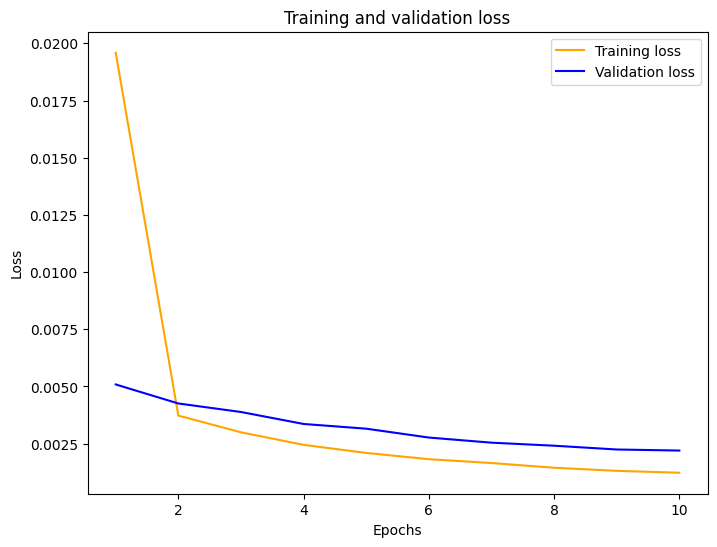

In [29]:
plot_curve(hist_batch_size64)

In [30]:
predict_scaled_batch_size64 = model_batch_size64.predict(X_test)
predict_batch_size64 = sc.inverse_transform(predict_scaled_batch_size64)
test1['LSTM_4_batch_size'] = predict_batch_size64
test1

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_adam,LSTM_50_rms,LSTM_4_batch_size
0,2021-12-10 15:24:00,0.538,0.553521,0.559533,0.572373
1,2021-12-10 15:25:00,0.588,0.539090,0.542474,0.545968
2,2021-12-10 15:26:00,0.566,0.582801,0.596317,0.566643
3,2021-12-10 15:27:00,0.562,0.574865,0.573795,0.573504
4,2021-12-10 15:28:00,0.612,0.564166,0.570051,0.571638
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.179252,0.171905,0.172274
3009,2021-12-16 13:59:00,0.169,0.178754,0.171770,0.171967
3010,2021-12-16 14:00:00,0.147,0.179494,0.172720,0.172322
3011,2021-12-16 14:01:00,0.145,0.162189,0.151798,0.161371


In [31]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test1['DateTime'], y = test1['LSTM_4_batch_size'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [32]:
lstm_mse_error_batch_size64 = mean_squared_error(test1['cloud_cover'], test1['LSTM_4_batch_size'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_batch_size64)

Better MSE value is :  0.0020314994938220687


,Model,MSE error
0,model,0.002031
1,model_1,0.002185


In [33]:
data2 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':64, 'Learning rate':'', 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_batch_size64}]

mse_data = mse_data.append(data2,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_3412\3885663084.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,25,Adam,32,,50,,,,,1,10,0.002031
1,25,RMSprop,32,,50,,,,,1,10,0.002087
2,25,Adam,64,,50,,,,,1,10,0.002185


---

### learning rate 0.1

In [34]:
test2 = test.copy()

#### Add frist layer: units = 50

In [35]:
model_01 = Sequential()
model_01.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_01.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.1)
model_01.compile(optimizer = opt, loss = 'mean_squared_error')
hist_01 = model_01.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 9s 14ms/step - loss: 0.1022 - val_loss: 0.0023
Epoch 2/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0012 - val_loss: 0.0023
Epoch 3/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0013 - val_loss: 0.0024
Epoch 4/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0013 - val_loss: 0.0029
Epoch 5/10
376/376 [==============================] - 6s 17ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 6/10
376/376 [==============================] - 7s 19ms/step - loss: 0.0012 - val_loss: 0.0023
Epoch 7/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0012 - val_loss: 0.0024
Epoch 8/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0013 - val_loss: 0.0023
Epoch 9/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0013 - val_loss: 0.0022
Epoch 10/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0014 - val_lo

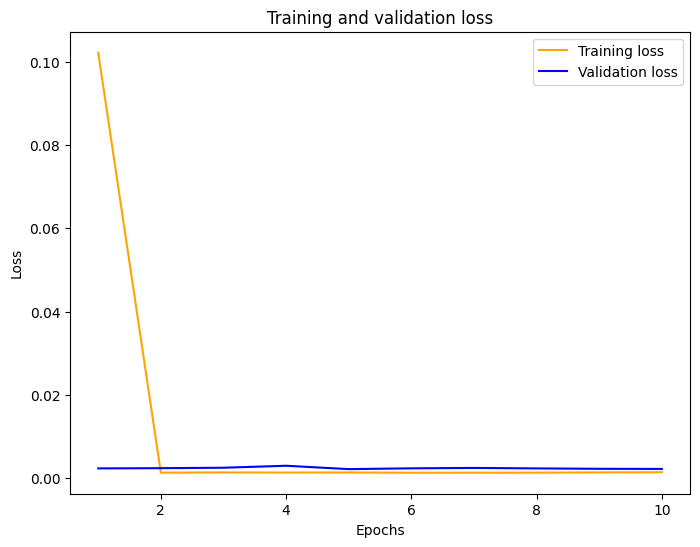

In [36]:
plot_curve(hist_01)

In [37]:
predict_scaled_01 = model_01.predict(X_test)
predict_01 = sc.inverse_transform(predict_scaled_01)
test2['LSTM_01'] = predict_01
test2

95/95 [==============================] - 1s 3ms/step


,DateTime,cloud_cover,LSTM_01
0,2021-12-10 15:24:00,0.538,0.545272
1,2021-12-10 15:25:00,0.588,0.532979
2,2021-12-10 15:26:00,0.566,0.588022
3,2021-12-10 15:27:00,0.562,0.560989
4,2021-12-10 15:28:00,0.612,0.554987
...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.164419
3009,2021-12-16 13:59:00,0.169,0.165863
3010,2021-12-16 14:00:00,0.147,0.166026
3011,2021-12-16 14:01:00,0.145,0.140681


In [38]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_01'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [39]:
lstm_mse_error_unit_50_01 = mean_squared_error(test2['cloud_cover'], test2['LSTM_01'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_01)

Better MSE value is :  0.0020314994938220687


,Model,MSE error
0,model,0.002031
1,model_1,0.002137


In [40]:
data3 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.1, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_01}]

mse_data = mse_data.append(data3,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_3412\3801007066.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,25,Adam,32,,50,,,,,1,10,0.002031
1,25,RMSprop,32,,50,,,,,1,10,0.002087
2,25,Adam,64,,50,,,,,1,10,0.002185
3,25,Adam,32,0.1,50,,,,,1,10,0.002137


----------------------------------------------------------------------------------

### lr 0.05

#### Add frist layer: units = 50

In [41]:
model_005 = Sequential()
model_005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.05)
model_005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_005 = model_005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 7s 11ms/step - loss: 0.0155 - val_loss: 0.0022
Epoch 2/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 3/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0011 - val_loss: 0.0025
Epoch 4/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0011 - val_loss: 0.0032
Epoch 5/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 6/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0011 - val_loss: 0.0024
Epoch 7/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0011 - val_loss: 0.0024
Epoch 8/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0012 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 4s 10ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 4s 9ms/step - loss: 0.0011 - val_loss:

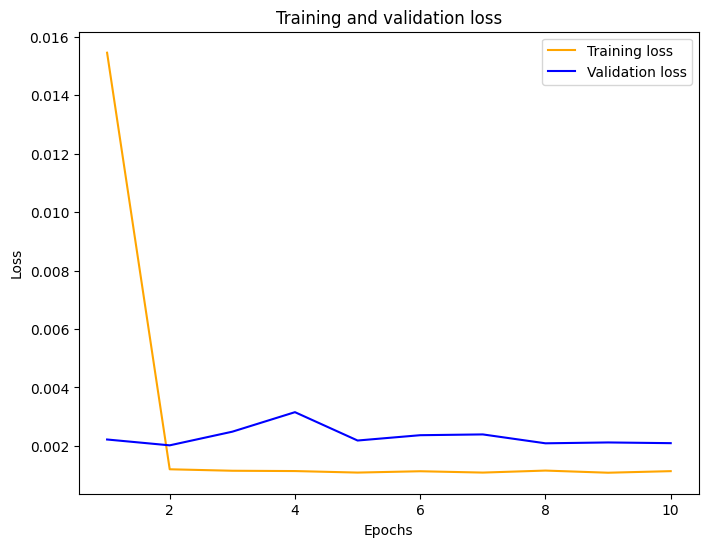

In [42]:
plot_curve(hist_005)

In [43]:
predict_scaled_005 = model_005.predict(X_test)
predict_005 = sc.inverse_transform(predict_scaled_005)
test2['LSTM_005'] = predict_005
test2

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005
0,2021-12-10 15:24:00,0.538,0.545272,0.549967
1,2021-12-10 15:25:00,0.588,0.532979,0.533065
2,2021-12-10 15:26:00,0.566,0.588022,0.592403
3,2021-12-10 15:27:00,0.562,0.560989,0.562852
4,2021-12-10 15:28:00,0.612,0.554987,0.560274
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.164419,0.166886
3009,2021-12-16 13:59:00,0.169,0.165863,0.167043
3010,2021-12-16 14:00:00,0.147,0.166026,0.168180
3011,2021-12-16 14:01:00,0.145,0.140681,0.144227


In [44]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [45]:
lstm_mse_error_unit_50_005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_005'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_unit_50_005)

Better MSE value is :  0.0020314994938220687


,Model,MSE error
0,model,0.002031
1,model_1,0.002083


In [46]:
data4 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.05, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_005}]

mse_data = mse_data.append(data4,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_3412\1866323465.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,25,Adam,32,,50,,,,,1,10,0.002031
1,25,RMSprop,32,,50,,,,,1,10,0.002087
2,25,Adam,64,,50,,,,,1,10,0.002185
3,25,Adam,32,0.1,50,,,,,1,10,0.002137
4,25,Adam,32,0.05,50,,,,,1,10,0.002083


----------------------------------------------------------------------------------

### lr 0.01

#### Add frist layer: units = 50

In [47]:
model_001 = Sequential()
model_001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.01)
model_001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_001 = model_001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 11s 16ms/step - loss: 0.0053 - val_loss: 0.0025
Epoch 2/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0013 - val_loss: 0.0021
Epoch 3/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 4/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 5/10
376/376 [==============================] - 5s 14ms/step - loss: 9.9266e-04 - val_loss: 0.0021
Epoch 6/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0011 - val_loss: 0.0022
Epoch 7/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 8/10
376/376 [==============================] - 5s 13ms/step - loss: 9.9879e-04 - val_loss: 0.0020
Epoch 9/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0010 - val_loss: 0.0022
Epoch 10/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0010

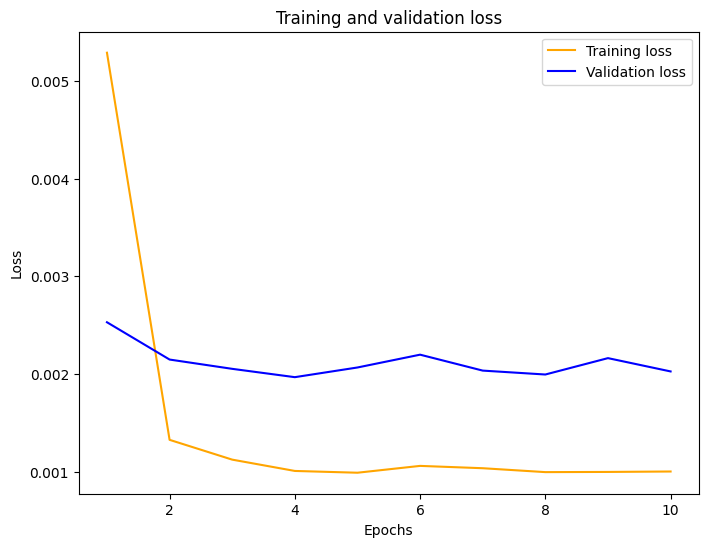

In [48]:
plot_curve(hist_001)

In [49]:
predict_scaled_001 = model_001.predict(X_test)
predict_001 = sc.inverse_transform(predict_scaled_001)
test2['LSTM_001'] = predict_001
test2

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001
0,2021-12-10 15:24:00,0.538,0.545272,0.549967,0.555102
1,2021-12-10 15:25:00,0.588,0.532979,0.533065,0.537290
2,2021-12-10 15:26:00,0.566,0.588022,0.592403,0.591609
3,2021-12-10 15:27:00,0.562,0.560989,0.562852,0.564197
4,2021-12-10 15:28:00,0.612,0.554987,0.560274,0.562952
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.164419,0.166886,0.170999
3009,2021-12-16 13:59:00,0.169,0.165863,0.167043,0.170914
3010,2021-12-16 14:00:00,0.147,0.166026,0.168180,0.171890
3011,2021-12-16 14:01:00,0.145,0.140681,0.144227,0.150677


In [50]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [51]:
lstm_mse_error_001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_adam,lstm_mse_error_001)

Better MSE value is :  0.0020179998083551713


,Model,MSE error
0,model,0.002031
1,model_1,0.002018


In [52]:
data = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.01, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_001}]

mse_data = mse_data.append(data,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_3412\3590241269.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,25,Adam,32,,50,,,,,1,10,0.002031
1,25,RMSprop,32,,50,,,,,1,10,0.002087
2,25,Adam,64,,50,,,,,1,10,0.002185
3,25,Adam,32,0.1,50,,,,,1,10,0.002137
4,25,Adam,32,0.05,50,,,,,1,10,0.002083
5,25,Adam,32,0.01,50,,,,,1,10,0.002018


----------------------------------------------------------------------------------

### lr 0.005

#### Add frist layer: units = 50

In [53]:
model_0005 = Sequential()
model_0005.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0005.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_0005.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0005 = model_0005.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 10s 16ms/step - loss: 0.0046 - val_loss: 0.0027
Epoch 2/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 3/10
376/376 [==============================] - 5s 14ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 4/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 5/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 6/10
376/376 [==============================] - 5s 12ms/step - loss: 9.9861e-04 - val_loss: 0.0021
Epoch 7/10
376/376 [==============================] - 5s 13ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 8/10
376/376 [==============================] - 5s 13ms/step - loss: 9.8431e-04 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 5s 13ms/step - loss: 9.8492e-04 - val_loss: 0.0022
Epoch 10/10
376/376 [==============================] - 5s 12ms/step - loss: 9.

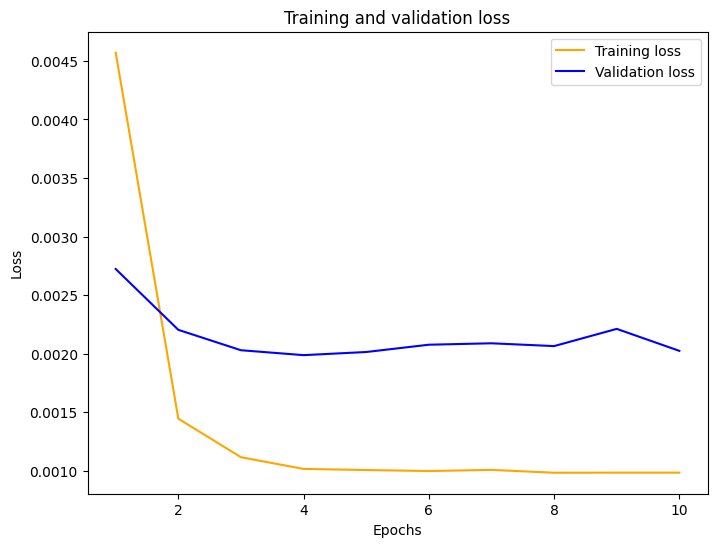

In [54]:
plot_curve(hist_0005)

In [55]:
predict_scaled_0005 = model_0005.predict(X_test)
predict_0005 = sc.inverse_transform(predict_scaled_0005)
test2['LSTM_0005'] = predict_0005
test2

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005
0,2021-12-10 15:24:00,0.538,0.545272,0.549967,0.555102,0.557075
1,2021-12-10 15:25:00,0.588,0.532979,0.533065,0.537290,0.536416
2,2021-12-10 15:26:00,0.566,0.588022,0.592403,0.591609,0.590133
3,2021-12-10 15:27:00,0.562,0.560989,0.562852,0.564197,0.558018
4,2021-12-10 15:28:00,0.612,0.554987,0.560274,0.562952,0.560596
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.164419,0.166886,0.170999,0.165441
3009,2021-12-16 13:59:00,0.169,0.165863,0.167043,0.170914,0.165520
3010,2021-12-16 14:00:00,0.147,0.166026,0.168180,0.171890,0.166420
3011,2021-12-16 14:01:00,0.145,0.140681,0.144227,0.150677,0.145524


In [56]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0005'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [57]:
lstm_mse_error_unit_50_0005 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0005'], squared=True)
compare_mse_model(lstm_mse_error_001,lstm_mse_error_unit_50_0005)

Better MSE value is :  0.0020143533007821912


,Model,MSE error
0,model,0.002018
1,model_1,0.002014


In [58]:
data5 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_50_0005}]

mse_data = mse_data.append(data5,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_3412\1941824271.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,25,Adam,32,,50,,,,,1,10,0.002031
1,25,RMSprop,32,,50,,,,,1,10,0.002087
2,25,Adam,64,,50,,,,,1,10,0.002185
3,25,Adam,32,0.1,50,,,,,1,10,0.002137
4,25,Adam,32,0.05,50,,,,,1,10,0.002083
5,25,Adam,32,0.01,50,,,,,1,10,0.002018
6,25,Adam,32,0.005,50,,,,,1,10,0.002014


----------------------------------------------------------------------------------

### lr 0.001

#### Add frist layer: units = 50

In [59]:
model_0001 = Sequential()
model_0001.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_0001.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.001)
model_0001.compile(optimizer = opt, loss = 'mean_squared_error')
hist_0001 = model_0001.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 11s 18ms/step - loss: 0.0098 - val_loss: 0.0039
Epoch 2/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0025 - val_loss: 0.0032
Epoch 3/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0019 - val_loss: 0.0028
Epoch 4/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0016 - val_loss: 0.0026
Epoch 5/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0014 - val_loss: 0.0023
Epoch 6/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0012 - val_loss: 0.0022
Epoch 7/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 8/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 9/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 10/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0010 - val_l

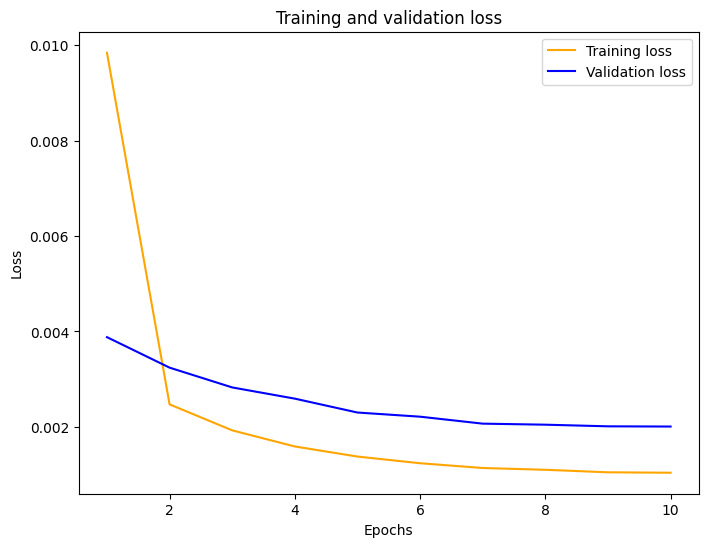

In [60]:
plot_curve(hist_0001)

In [61]:
predict_scaled_0001 = model_001.predict(X_test)
predict_0001 = sc.inverse_transform(predict_scaled_0001)
test2['LSTM_0001'] = predict_0001
test2

95/95 [==============================] - 0s 5ms/step


,DateTime,cloud_cover,LSTM_01,LSTM_005,LSTM_001,LSTM_0005,LSTM_0001
0,2021-12-10 15:24:00,0.538,0.545272,0.549967,0.555102,0.557075,0.555102
1,2021-12-10 15:25:00,0.588,0.532979,0.533065,0.537290,0.536416,0.537290
2,2021-12-10 15:26:00,0.566,0.588022,0.592403,0.591609,0.590133,0.591609
3,2021-12-10 15:27:00,0.562,0.560989,0.562852,0.564197,0.558018,0.564197
4,2021-12-10 15:28:00,0.612,0.554987,0.560274,0.562952,0.560596,0.562952
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.164419,0.166886,0.170999,0.165441,0.170999
3009,2021-12-16 13:59:00,0.169,0.165863,0.167043,0.170914,0.165520,0.170914
3010,2021-12-16 14:00:00,0.147,0.166026,0.168180,0.171890,0.166420,0.171890
3011,2021-12-16 14:01:00,0.145,0.140681,0.144227,0.150677,0.145524,0.150677


In [62]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test2['DateTime'], y = test2['LSTM_0001'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [63]:
lstm_mse_error_0001 = mean_squared_error(test2['cloud_cover'], test2['LSTM_0001'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_0001)

Better MSE value is :  0.0020143533007821912


,Model,MSE error
0,model,0.002014
1,model_1,0.002018


In [64]:
data6 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.001, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_0001}]

mse_data = mse_data.append(data6,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_3412\2992915496.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,25,Adam,32,,50,,,,,1,10,0.002031
1,25,RMSprop,32,,50,,,,,1,10,0.002087
2,25,Adam,64,,50,,,,,1,10,0.002185
3,25,Adam,32,0.1,50,,,,,1,10,0.002137
4,25,Adam,32,0.05,50,,,,,1,10,0.002083
5,25,Adam,32,0.01,50,,,,,1,10,0.002018
6,25,Adam,32,0.005,50,,,,,1,10,0.002014
7,25,Adam,32,0.001,50,,,,,1,10,0.002018


----------------------------------------------------------------------------------

## Optimizer adam

### Add frist layer: units = 100

In [65]:
test3 = test.copy()

In [66]:
test3['LSTM_50'] = predict_0005

In [67]:
model_1 = Sequential()
model_1.add(LSTM(units = 100, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_1.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_1.compile(optimizer = opt, loss = 'mean_squared_error')
hist_1 = model_1.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 12s 21ms/step - loss: 0.0037 - val_loss: 0.0028
Epoch 2/10
376/376 [==============================] - 7s 18ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 3/10
376/376 [==============================] - 7s 17ms/step - loss: 0.0010 - val_loss: 0.0020
Epoch 4/10
376/376 [==============================] - 7s 18ms/step - loss: 0.0010 - val_loss: 0.0022
Epoch 5/10
376/376 [==============================] - 6s 17ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 6/10
376/376 [==============================] - 7s 17ms/step - loss: 0.0010 - val_loss: 0.0025
Epoch 7/10
376/376 [==============================] - 6s 17ms/step - loss: 9.9361e-04 - val_loss: 0.0021
Epoch 8/10
376/376 [==============================] - 7s 19ms/step - loss: 9.8757e-04 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 7s 18ms/step - loss: 9.8850e-04 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 7s 17ms/step - loss: 9.

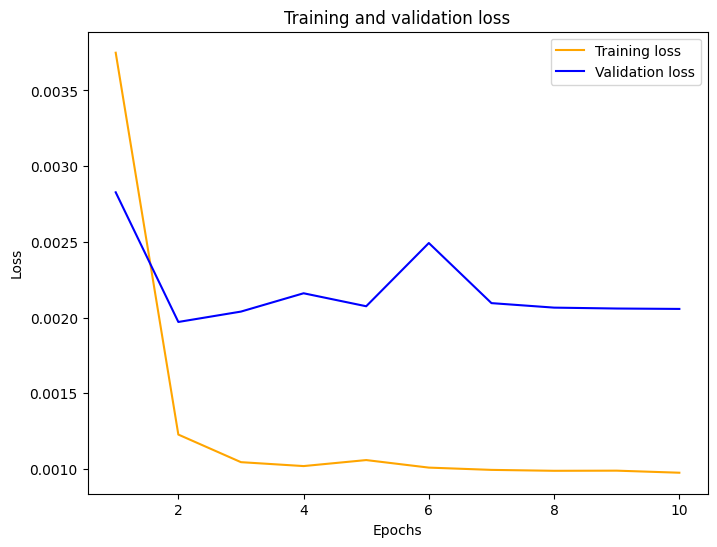

In [68]:
plot_curve(hist_1)

In [69]:
predict_scaled_1 = model_1.predict(X_test)
predict_1 = sc.inverse_transform(predict_scaled_1)
test3['LSTM_100'] = predict_1
test3

95/95 [==============================] - 1s 6ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100
0,2021-12-10 15:24:00,0.538,0.557075,0.563878
1,2021-12-10 15:25:00,0.588,0.536416,0.542638
2,2021-12-10 15:26:00,0.566,0.590133,0.598561
3,2021-12-10 15:27:00,0.562,0.558018,0.561856
4,2021-12-10 15:28:00,0.612,0.560596,0.566163
...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.165441,0.170163
3009,2021-12-16 13:59:00,0.169,0.165520,0.170371
3010,2021-12-16 14:00:00,0.147,0.166420,0.171294
3011,2021-12-16 14:01:00,0.145,0.145524,0.149186


In [70]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_100'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [71]:
lstm_mse_error_unit_100 = mean_squared_error(test3['cloud_cover'], test3['LSTM_100'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_unit_100)

Better MSE value is :  0.0020143533007821912


,Model,MSE error
0,model,0.002014
1,model_1,0.002047


In [72]:
data7 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'The frist layer': 100, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_unit_100}]

mse_data = mse_data.append(data7,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_3412\320682731.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,25,Adam,32,,50,,,,,1,10,0.002031
1,25,RMSprop,32,,50,,,,,1,10,0.002087
2,25,Adam,64,,50,,,,,1,10,0.002185
3,25,Adam,32,0.1,50,,,,,1,10,0.002137
4,25,Adam,32,0.05,50,,,,,1,10,0.002083
5,25,Adam,32,0.01,50,,,,,1,10,0.002018
6,25,Adam,32,0.005,50,,,,,1,10,0.002014
7,25,Adam,32,0.001,50,,,,,1,10,0.002018
8,25,Adam,32,0.005,100,,,,,1,10,0.002047


------------

### Add frist layer: units = 50 and Add Dropout = 0.1

In [73]:
model_2 = Sequential()
model_2.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_2.add(Dropout(0.1))
model_2.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_2.compile(optimizer = opt, loss = 'mean_squared_error')
hist_2 = model_2.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 9s 14ms/step - loss: 0.0073 - val_loss: 0.0032
Epoch 2/10
376/376 [==============================] - 5s 12ms/step - loss: 0.0026 - val_loss: 0.0025
Epoch 3/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0021 - val_loss: 0.0022
Epoch 4/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0018 - val_loss: 0.0022
Epoch 5/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0016 - val_loss: 0.0020
Epoch 6/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 7/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0014 - val_loss: 0.0020
Epoch 8/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 9/10
376/376 [==============================] - 4s 11ms/step - loss: 0.0014 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 4s 12ms/step - loss: 0.0014 - val_lo

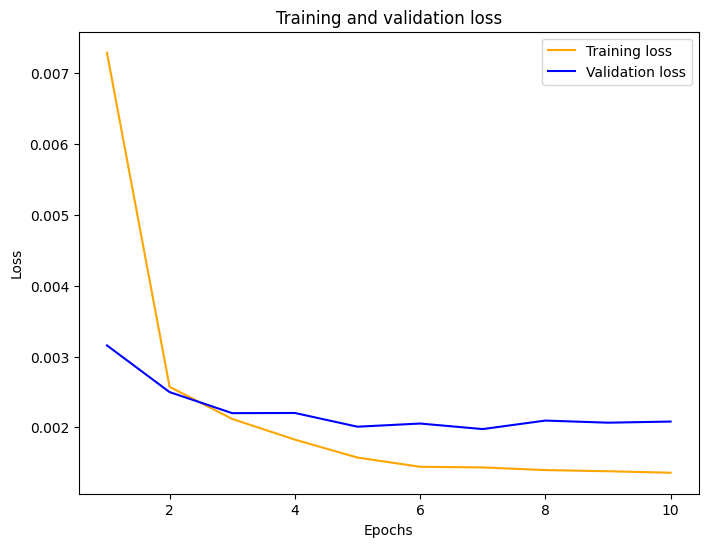

In [74]:
plot_curve(hist_2)

In [75]:
predict_scaled_2 = model_2.predict(X_test)
predict_2 = sc.inverse_transform(predict_scaled_2)
test3['LSTM_Drop_out'] = predict_2
test3

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out
0,2021-12-10 15:24:00,0.538,0.557075,0.563878,0.555452
1,2021-12-10 15:25:00,0.588,0.536416,0.542638,0.539198
2,2021-12-10 15:26:00,0.566,0.590133,0.598561,0.588856
3,2021-12-10 15:27:00,0.562,0.558018,0.561856,0.568047
4,2021-12-10 15:28:00,0.612,0.560596,0.566163,0.562293
...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.165441,0.170163,0.161621
3009,2021-12-16 13:59:00,0.169,0.165520,0.170371,0.161233
3010,2021-12-16 14:00:00,0.147,0.166420,0.171294,0.162144
3011,2021-12-16 14:01:00,0.145,0.145524,0.149186,0.142713


In [76]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_Drop_out'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [77]:
lstm_mse_error_50_drop_out = mean_squared_error(test3['cloud_cover'], test3['LSTM_Drop_out'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_50_drop_out)

Better MSE value is :  0.0020143533007821912


,Model,MSE error
0,model,0.002014
1,model_1,0.002071


In [78]:
data8 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'The frist layer': 50, 'The frist layer add Drop out':0.1, 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_50_drop_out}]

mse_data = mse_data.append(data8,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_3412\580712742.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,25,Adam,32,,50,,,,,1,10,0.002031
1,25,RMSprop,32,,50,,,,,1,10,0.002087
2,25,Adam,64,,50,,,,,1,10,0.002185
3,25,Adam,32,0.1,50,,,,,1,10,0.002137
4,25,Adam,32,0.05,50,,,,,1,10,0.002083
5,25,Adam,32,0.01,50,,,,,1,10,0.002018
6,25,Adam,32,0.005,50,,,,,1,10,0.002014
7,25,Adam,32,0.001,50,,,,,1,10,0.002018
8,25,Adam,32,0.005,100,,,,,1,10,0.002047
9,25,Adam,32,0.005,50,0.1,,,,1,10,0.002071


------------------------------------

### Add frist layer: units = 50 and Add second layer: unit = 50

In [79]:
model_3 = Sequential()
model_3.add(LSTM(units = 50, return_sequences = True, input_shape = (X_train.shape[1], 1)))
model_3.add(LSTM(units = 50))
model_3.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_3.compile(optimizer = opt, loss = 'mean_squared_error')
hist_3 = model_3.fit(X_train, y_train, validation_data=(X_test, y_test),  epochs = 10, batch_size = 32)

Epoch 1/10
376/376 [==============================] - 16s 26ms/step - loss: 0.0061 - val_loss: 0.0032
Epoch 2/10
376/376 [==============================] - 8s 22ms/step - loss: 0.0017 - val_loss: 0.0022
Epoch 3/10
376/376 [==============================] - 12s 33ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 4/10
376/376 [==============================] - 9s 24ms/step - loss: 0.0011 - val_loss: 0.0021
Epoch 5/10
376/376 [==============================] - 9s 23ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 6/10
376/376 [==============================] - 9s 23ms/step - loss: 0.0011 - val_loss: 0.0027
Epoch 7/10
376/376 [==============================] - 9s 24ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 8/10
376/376 [==============================] - 9s 23ms/step - loss: 0.0012 - val_loss: 0.0020
Epoch 9/10
376/376 [==============================] - 9s 23ms/step - loss: 0.0010 - val_loss: 0.0021
Epoch 10/10
376/376 [==============================] - 9s 24ms/step - loss: 0.0011 - val_

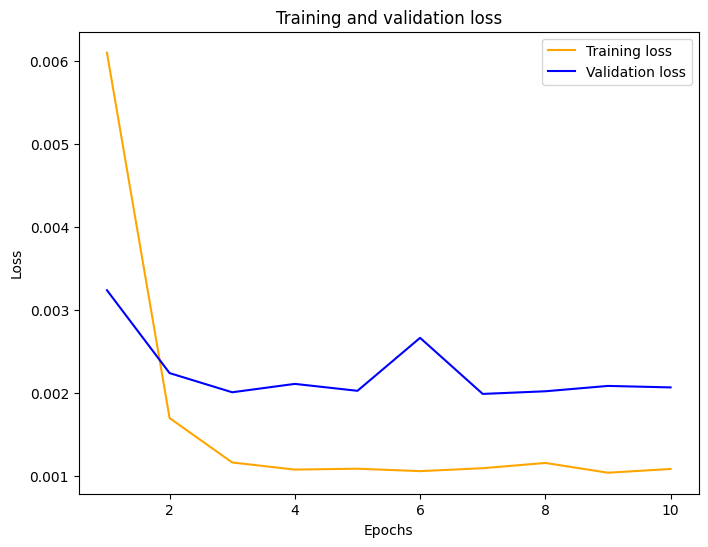

In [80]:
plot_curve(hist_3)

In [81]:
predict_scaled_3 = model_3.predict(X_test)
predict_3 = sc.inverse_transform(predict_scaled_3)
test3['LSTM_second_layer_50'] = predict_3
test3

95/95 [==============================] - 2s 11ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50
0,2021-12-10 15:24:00,0.538,0.557075,0.563878,0.555452,0.554007
1,2021-12-10 15:25:00,0.588,0.536416,0.542638,0.539198,0.537770
2,2021-12-10 15:26:00,0.566,0.590133,0.598561,0.588856,0.593680
3,2021-12-10 15:27:00,0.562,0.558018,0.561856,0.568047,0.565397
4,2021-12-10 15:28:00,0.612,0.560596,0.566163,0.562293,0.562574
...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.165441,0.170163,0.161621,0.167487
3009,2021-12-16 13:59:00,0.169,0.165520,0.170371,0.161233,0.167371
3010,2021-12-16 14:00:00,0.147,0.166420,0.171294,0.162144,0.168351
3011,2021-12-16 14:01:00,0.145,0.145524,0.149186,0.142713,0.147410


In [82]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_second_layer_50'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [83]:
lstm_mse_error_second_layer = mean_squared_error(test3['cloud_cover'], test3['LSTM_second_layer_50'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_second_layer)

Better MSE value is :  0.0020143533007821912


,Model,MSE error
0,model,0.002014
1,model_1,0.002056


In [84]:
data10 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':50, 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':10 ,'mse error':lstm_mse_error_second_layer}]

mse_data = mse_data.append(data10,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_3412\4214147441.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,25,Adam,32,,50,,,,,1,10,0.002031
1,25,RMSprop,32,,50,,,,,1,10,0.002087
2,25,Adam,64,,50,,,,,1,10,0.002185
3,25,Adam,32,0.1,50,,,,,1,10,0.002137
4,25,Adam,32,0.05,50,,,,,1,10,0.002083
5,25,Adam,32,0.01,50,,,,,1,10,0.002018
6,25,Adam,32,0.005,50,,,,,1,10,0.002014
7,25,Adam,32,0.001,50,,,,,1,10,0.002018
8,25,Adam,32,0.005,100,,,,,1,10,0.002047
9,25,Adam,32,0.005,50,0.1,,,,1,10,0.002071


---

### Add frist layer: units = 100 and change epochs from 10 to 20

In [85]:
model_5 = Sequential()
model_5.add(LSTM(units = 50, return_sequences = False, input_shape = (X_train.shape[1], 1)))
model_5.add(Dense(units = 1))
opt = optimizers.Adam(learning_rate=0.005)
model_5.compile(optimizer = opt, loss = 'mean_squared_error')
hist_5 = model_5.fit(X_train, y_train, validation_data=(X_test, y_test), epochs = 20, batch_size = 32)

Epoch 1/20
376/376 [==============================] - 10s 14ms/step - loss: 0.0058 - val_loss: 0.0030
Epoch 2/20
376/376 [==============================] - 5s 13ms/step - loss: 0.0017 - val_loss: 0.0025
Epoch 3/20
376/376 [==============================] - 5s 12ms/step - loss: 0.0014 - val_loss: 0.0022
Epoch 4/20
376/376 [==============================] - 5s 12ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 5/20
376/376 [==============================] - 5s 12ms/step - loss: 0.0011 - val_loss: 0.0020
Epoch 6/20
376/376 [==============================] - 5s 12ms/step - loss: 9.8194e-04 - val_loss: 0.0020
Epoch 7/20
376/376 [==============================] - 4s 12ms/step - loss: 9.9947e-04 - val_loss: 0.0020
Epoch 8/20
376/376 [==============================] - 5s 12ms/step - loss: 9.9400e-04 - val_loss: 0.0021
Epoch 9/20
376/376 [==============================] - 4s 12ms/step - loss: 9.8033e-04 - val_loss: 0.0021
Epoch 10/20
376/376 [==============================] - 4s 12ms/step - loss

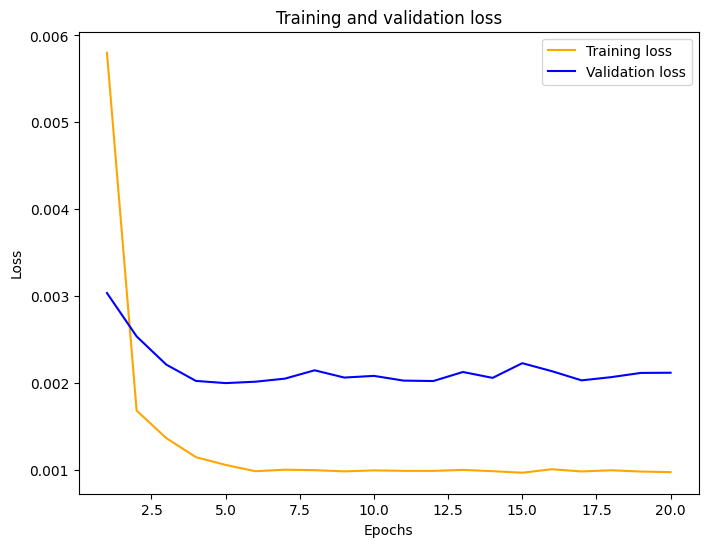

In [86]:
plot_curve(hist_5)

In [87]:
predict_scaled_5 = model_5.predict(X_test)
predict_5 = sc.inverse_transform(predict_scaled_5)
test3['LSTM_epoch20'] = predict_5
test3

95/95 [==============================] - 1s 4ms/step


,DateTime,cloud_cover,LSTM_50,LSTM_100,LSTM_Drop_out,LSTM_second_layer_50,LSTM_epoch20
0,2021-12-10 15:24:00,0.538,0.557075,0.563878,0.555452,0.554007,0.543025
1,2021-12-10 15:25:00,0.588,0.536416,0.542638,0.539198,0.537770,0.525015
2,2021-12-10 15:26:00,0.566,0.590133,0.598561,0.588856,0.593680,0.580239
3,2021-12-10 15:27:00,0.562,0.558018,0.561856,0.568047,0.565397,0.550433
4,2021-12-10 15:28:00,0.612,0.560596,0.566163,0.562293,0.562574,0.550589
...,...,...,...,...,...,...,...
3008,2021-12-16 13:58:00,0.168,0.165441,0.170163,0.161621,0.167487,0.162715
3009,2021-12-16 13:59:00,0.169,0.165520,0.170371,0.161233,0.167371,0.162886
3010,2021-12-16 14:00:00,0.147,0.166420,0.171294,0.162144,0.168351,0.163882
3011,2021-12-16 14:01:00,0.145,0.145524,0.149186,0.142713,0.147410,0.141091


In [88]:
fig = go.Figure()
fig.add_trace(go.Scatter(mode = 'lines', x = cloud_cover['DateTime'], y = cloud_cover['cloud_cover'], name = 'Actual'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['cloud_cover'], name = 'Actual Test'))
fig.add_trace(go.Scatter(mode = 'lines', x = test3['DateTime'], y = test3['LSTM_epoch20'], name = 'predict'))
fig.update_layout(
    autosize=True,
    height=600,
    title="LSTM Model",
    xaxis_title="Date",
    yaxis_title="Cloud cover",
)


fig.update_layout(
    xaxis=dict(
        rangeselector=dict(
            buttons=list([
                dict(count=1,
                     label="1.zoom",
                     step="hour",
                     stepmode="backward"),
                 dict(count=2,
                     label="2.zoom",
                     step="hour",
                     stepmode="backward"),
                dict(count=3,
                     label="3.zoom",
                     step="day",
                     stepmode="backward"),              

                dict(step="all")
            ])
        ),
        rangeslider=dict(
            visible=True
        ),
        type="date"
    )
)

fig.show()

In [90]:
lstm_mse_error_unit_50_epoch20 = mean_squared_error(test3['cloud_cover'], test3['LSTM_epoch20'], squared=True)
compare_mse_model(lstm_mse_error_unit_50_0005,lstm_mse_error_unit_50_epoch20)

Better MSE value is :  0.0020143533007821912


,Model,MSE error
0,model,0.002014
1,model_1,0.002105


In [91]:
data11 = [{'Lags':25 ,'Optimizer':'Adam', 'Batch_size':32, 'Learning rate':0.005, 'The frist layer': 50, 'The frist layer add Drop out':'', 'The second layer':'', 'The second layer add Drop out':'',
              'The third layer':'','The output layer':1, 'epochs':20 ,'mse error':lstm_mse_error_unit_50_epoch20}]

mse_data = mse_data.append(data11,ignore_index = True,sort = False)
mse_data

C:\Users\USER\AppData\Local\Temp\ipykernel_3412\3508570424.py:4: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,25,Adam,32,,50,,,,,1,10,0.002031
1,25,RMSprop,32,,50,,,,,1,10,0.002087
2,25,Adam,64,,50,,,,,1,10,0.002185
3,25,Adam,32,0.1,50,,,,,1,10,0.002137
4,25,Adam,32,0.05,50,,,,,1,10,0.002083
5,25,Adam,32,0.01,50,,,,,1,10,0.002018
6,25,Adam,32,0.005,50,,,,,1,10,0.002014
7,25,Adam,32,0.001,50,,,,,1,10,0.002018
8,25,Adam,32,0.005,100,,,,,1,10,0.002047
9,25,Adam,32,0.005,50,0.1,,,,1,10,0.002071


---

# save model

In [92]:
mse_lstm = pd.read_csv('data_lstm_mse.csv')
mse_lstm

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.002492
5,5,Adam,32,0.010,50,NaN,NaN,NaN,NaN,1,10,0.002080
6,5,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.002007
7,5,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.002080
8,5,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.002043
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987


In [93]:
mse_data

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,25,Adam,32,,50,,,,,1,10,0.002031
1,25,RMSprop,32,,50,,,,,1,10,0.002087
2,25,Adam,64,,50,,,,,1,10,0.002185
3,25,Adam,32,0.1,50,,,,,1,10,0.002137
4,25,Adam,32,0.05,50,,,,,1,10,0.002083
5,25,Adam,32,0.01,50,,,,,1,10,0.002018
6,25,Adam,32,0.005,50,,,,,1,10,0.002014
7,25,Adam,32,0.001,50,,,,,1,10,0.002018
8,25,Adam,32,0.005,100,,,,,1,10,0.002047
9,25,Adam,32,0.005,50,0.1,,,,1,10,0.002071


In [94]:
mse_lags = pd.concat([mse_lstm,mse_data],ignore_index=True)
mse_lags

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.1,50,NaN,NaN,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.05,50,NaN,NaN,NaN,NaN,1,10,0.002492
...,...,...,...,...,...,...,...,...,...,...,...,...
56,25,Adam,32,0.001,50,,,,,1,10,0.002018
57,25,Adam,32,0.005,100,,,,,1,10,0.002047
58,25,Adam,32,0.005,50,0.1,,,,1,10,0.002071
59,25,Adam,32,0.005,50,,50,,,1,10,0.002056


In [95]:
mse_lags.to_csv('data_lstm_mse.csv',index=False)

In [96]:
mse_lstm1 = pd.read_csv('data_lstm_mse.csv')
mse_lstm1

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
0,5,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002086
1,5,RMSprop,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002107
2,5,Adam,64,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002431
3,5,Adam,32,0.100,50,NaN,NaN,NaN,NaN,1,10,0.002102
4,5,Adam,32,0.050,50,NaN,NaN,NaN,NaN,1,10,0.002492
...,...,...,...,...,...,...,...,...,...,...,...,...
56,25,Adam,32,0.001,50,NaN,NaN,NaN,NaN,1,10,0.002018
57,25,Adam,32,0.005,100,NaN,NaN,NaN,NaN,1,10,0.002047
58,25,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.002071
59,25,Adam,32,0.005,50,NaN,50.0,NaN,NaN,1,10,0.002056


In [97]:
mse = mse_lstm1.groupby(['Lags'])['mse error'].transform(min) == mse_lstm1['mse error']
mse_lstm1[mse]

,Lags,Optimizer,Batch_size,Learning rate,The frist layer,The frist layer add Drop out,The second layer,The second layer add Drop out,The third layer,The output layer,epochs,mse error
9,5,Adam,32,0.005,50,0.1,NaN,NaN,NaN,1,10,0.001987
13,10,Adam,32,NaN,50,NaN,NaN,NaN,NaN,1,10,0.002009
33,15,Adam,32,NaN,100,NaN,NaN,NaN,NaN,1,10,0.001995
45,20,Adam,32,NaN,100,NaN,NaN,NaN,NaN,1,10,0.001988
55,25,Adam,32,0.005,50,NaN,NaN,NaN,NaN,1,10,0.002014


In [ ]:
model_0005.save('model_train_80%_lag25.h5')